# Reddit Analytics for Data Science

## Data Loading (Preparation)

In [1]:
# Reads in data, drops duplicate rows, and joins data, creating and filling columns for each score and num_comments interval
import pandas as pd

# Set input filenames
stream_fname = 'stream_AskReddit+Pics+Gifs+Videos+WorldNews+Funny+Aww+gaming_2018-11-30_003448.csv'
score_fname = 'score_AskReddit+Pics+Gifs+Videos+WorldNews+Funny+Aww+gaming_2018-11-30_003448.csv'

# Read csv files into dataframes, drop duplicate rows from each
data_raw = pd.read_csv(stream_fname, index_col='id')
data_raw = data_raw[~data_raw.index.duplicated(keep='first')]
scores = pd.read_csv(score_fname)
scores = scores[~scores[['id','minutes']].duplicated(keep='first')]
scores.set_index(keys='id', inplace=True)

# Intervals for sample data 
mins_list = [5, 10, 15, 30, 60] + [120 + 60 * k for k in range(23)]

# Join data, creating columns for fields that we need to track over time
for mins in mins_list:
    data_raw = data_raw.join(scores[scores.minutes == mins][['score', 'num_comments','num_crossposts','gilded']], 
                             rsuffix = '_%d' % mins)

## Data Massaging & Target Variable creation

In [2]:
# Set data to copy of data_raw so we don't have to re-read from file every time we want to change threshold
data = data_raw.copy()

# Drop rows with NaN values in 'score_1440' as it determines the target variable
data = data[data['score_1440'].notna()]

# Drop columns we don't need 
data.drop(columns=['time_retrieved_utc', 'score', 'subreddit_id', 'minutes', 'permalink', 
                   '_comments_by_id', 'author', 'num_comments', 'num_crossposts'], inplace=True)

# Set thresholds for target variable and predict-by time
target_score = 3656
predict_by = 5

# Create target variable column based on condition (data[score_predict_by] >= target_score)
data['Y'] = data['score_1440'].apply(lambda x: 1 if x >= target_score else 0)

# Drop '_mins' columns after predict-by time
data.drop(columns=['score_'+str(mins) for mins in mins_list if mins > predict_by], inplace=True)
data.drop(columns=['num_comments_'+str(mins) for mins in mins_list if mins > predict_by], inplace=True)
data.drop(columns=['num_crossposts_'+str(mins) for mins in mins_list if mins > predict_by], inplace=True)
data.drop(columns=['gilded_'+str(mins) for mins in mins_list if mins > predict_by], inplace=True) 

In [3]:
#Verify data (and missing feature values)
print(data.shape, data[data.isna().any(axis=1)].shape)
#data[data.isna().any(axis=1)].head()
data.head()

(52419, 16) (0, 16)


,comment_karma,link_karma,title,created_utc,over_18,url,subreddit,subreddit_subscribers,stickied,gilded,is_self,score_5,num_comments_5,num_crossposts_5,gilded_5,Y
id,,,,,,,,,,,,,,,,
a1plim,44,1,When Bethesda is already in hot water over the...,1.543556e+09,False,https://www.reddit.com/r/gaming/comments/a1pli...,gaming,19748492,False,0,True,0.0,1.0,0.0,0.0,0
a1pljt,1814,3747,"Doctors, what is your professional opinion on ...",1.543556e+09,False,https://www.reddit.com/r/AskReddit/comments/a1...,AskReddit,20758165,False,0,True,2.0,1.0,0.0,0.0,0
a1plk5,791,1454,Australian Resources Minister says students pr...,1.543556e+09,False,https://www.smh.com.au/politics/federal/climat...,worldnews,19975472,False,0,False,2.0,1.0,0.0,0.0,0
a1plk8,74,3899,When was a time you were literally left speech...,1.543556e+09,False,https://www.reddit.com/r/AskReddit/comments/a1...,AskReddit,20758165,False,0,True,1.0,4.0,0.0,0.0,0
a1plln,19,3,What is your best argument for the supernatural?,1.543556e+09,False,https://www.reddit.com/r/AskReddit/comments/a1...,AskReddit,20758165,False,0,True,1.0,3.0,0.0,0.0,0


$$\textbf{Now dataset is well-cleaned and ready for processing!}$$

## Feature Engineering

In [4]:
from datetime import datetime
import tldextract

# Add columns for differences between each interval of scores, num_comments, num_crossposts, and gilded
# !!! also try rates instead of differences 
for col in ['score_','num_comments_','num_crossposts_','gilded_']:
    for idx, mins in enumerate(mins_list):
        if mins < predict_by:
            data[col+'diff_'+str(mins_list[idx])+'_'+str(mins_list[idx+1])] = data[col+str(mins_list[idx+1])] \
                                                                                -data[col+str(mins_list[idx])]   
    
# Reset index to default
data.reset_index(drop=True, inplace=True)

# Title engineering/NLP -- (!!! dropping all text for now, until we do text/NLP)
data['title_len'] = data['title'].apply(len)
data.drop(columns=['title'], inplace=True)

# Text processing/NLP

# Converting created_utc to day_of_week and hour_of_day and adding these columns, then drop created-utc
def utc_to_day(utc):
    return datetime.fromtimestamp(utc).strftime('%A') 

def utc_to_hour(utc):
    return datetime.fromtimestamp(utc).strftime('%H')

data['day'] = data['created_utc'].apply(utc_to_day)
data['hour'] = data['created_utc'].apply(utc_to_hour)
data.drop(columns=['created_utc'], inplace=True)

# Extract domain from url's and add as column 
def domain_extract(url):
    return tldextract.extract(url).domain

data['domain'] = data['url'].apply(domain_extract)
data.drop(columns=['url'], inplace=True)

In [5]:
data.head()

,comment_karma,link_karma,over_18,subreddit,subreddit_subscribers,stickied,gilded,is_self,score_5,num_comments_5,num_crossposts_5,gilded_5,Y,title_len,day,hour,domain
0,44,1,False,gaming,19748492,False,0,True,0.0,1.0,0.0,0.0,0,120,Friday,00,reddit
1,1814,3747,False,AskReddit,20758165,False,0,True,2.0,1.0,0.0,0.0,0,99,Friday,00,reddit
2,791,1454,False,worldnews,19975472,False,0,False,2.0,1.0,0.0,0.0,0,133,Friday,00,smh
3,74,3899,False,AskReddit,20758165,False,0,True,1.0,4.0,0.0,0.0,0,81,Friday,00,reddit
4,19,3,False,AskReddit,20758165,False,0,True,1.0,3.0,0.0,0.0,0,48,Friday,00,reddit


In [7]:
import sklearn
from sklearn import preprocessing

labels_lime = data['Y']
srcdata_lime = data.drop(columns='Y')
feature_names = srcdata_lime.columns.values
categorical_features = [3,13,14,15]
categorical_names = {}
for feature in categorical_features:
    le = sklearn.preprocessing.LabelEncoder()
    le.fit(srcdata_lime.iloc[:, feature])
    srcdata_lime.iloc[:, feature] = le.transform(srcdata_lime.iloc[:, feature])
    categorical_names[feature] = le.classes_

In [9]:
categorical_names
#feature_names

{3: array(['AskReddit', 'aww', 'funny', 'gaming', 'gifs', 'pics', 'videos',
        'worldnews'], dtype=object),
 13: array(['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Wednesday'],
       dtype=object),
 14: array(['00', '01', '02', '03', '04', '05', '06', '07', '08', '09', '10',
        '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21',
        '22', '23'], dtype=object),
 15: array(['112', '360cities', '3dn', '500px', '71republic', '9news',
        '9to5mac', 'abc', 'abc13', 'adn', 'advocate', 'afp',
        'airbearentertainment', 'airforce', 'alaraby', 'albawaba',
        'alberta', 'alexonsager', 'algerian-news', 'alive-story',
        'aljazeera', 'alltopviral', 'almasdarnews', 'almashhad-alyemeni',
        'altchar', 'amazon', 'amazonprimemovies', 'ampproject',
        'ancient-origins', 'ap', 'apnews', 'arcpublishing', 'arcsivr',
        'arstechnica', 'artstation', 'arynews', 'asahi', 'ascribur',
        'asiancorrespondent', 'astroneer', 'astronomy'

In [10]:
srcdata_lime = srcdata_lime.astype(float)
srcdata_lime.head()

,comment_karma,link_karma,over_18,subreddit,subreddit_subscribers,stickied,gilded,is_self,score_5,num_comments_5,num_crossposts_5,gilded_5,title_len,day,hour,domain
0,44.0,1.0,0.0,3.0,19748492.0,0.0,0.0,1.0,0.0,1.0,0.0,0.0,120.0,0.0,0.0,363.0
1,1814.0,3747.0,0.0,0.0,20758165.0,0.0,0.0,1.0,2.0,1.0,0.0,0.0,99.0,0.0,0.0,363.0
2,791.0,1454.0,0.0,7.0,19975472.0,0.0,0.0,0.0,2.0,1.0,0.0,0.0,133.0,0.0,0.0,392.0
3,74.0,3899.0,0.0,0.0,20758165.0,0.0,0.0,1.0,1.0,4.0,0.0,0.0,81.0,0.0,0.0,363.0
4,19.0,3.0,0.0,0.0,20758165.0,0.0,0.0,1.0,1.0,3.0,0.0,0.0,48.0,0.0,0.0,363.0


In [108]:
# Create dummy variables for all categorical data
#data = pd.get_dummies(data, columns=['subreddit','day','hour','domain'])
#data = pd.get_dummies(data, columns=['subreddit','day','hour'])

# Convert boolean variables to 1's and 0's
#data = data * 1

#Verify data (and missing feature values)
#print(data.shape, data[data.isna().any(axis=1)].shape)
#data.head()

## Train/Test Split

In [11]:
import numpy as np
from sklearn.model_selection import train_test_split

test_size = 0.2
random_state = int(np.random.rand() * (2 ** 32 - 1)) # use a new random state everytime as we run the cell

# Split train and test data
#X_train, X_test, Y_train, Y_test = train_test_split(data.drop(columns=['Y']), data['Y'], test_size=test_size, 
#                                                    stratify = data['Y'], random_state=random_state)

X_train, X_test, Y_train, Y_test = train_test_split(srcdata_lime, labels_lime, test_size=test_size, 
                                                    stratify = labels_lime, random_state=random_state)

In [12]:
print('X_train ',X_train.shape)
print('Y_train ',Y_train.shape)
print('X_test ',X_test.shape)
print('Y_test ',Y_test.shape)
#print('X_train_lime ',X_train_lime.shape)
#print('Y_train_lime ',Y_train_lime.shape)
#print('X_test_lime ',X_test_lime.shape)
#print('Y_test_lime ', Y_test_lime.shape)

X_train  (41935, 16)
Y_train  (41935,)
X_test  (10484, 16)
Y_test  (10484,)


## Downsampling Majority Class

In [13]:
majority_count = Y_train.value_counts()[0]
minority_count = Y_train.value_counts()[1]
print('majority_count: '+str(majority_count))
print('minority_count: '+str(minority_count))

majority_count: 41340
minority_count: 595


In [14]:
from sklearn.utils import resample

# Keep copy of non-downsampled data to try other techniques with
train_data = pd.concat([X_train,Y_train], axis = 1)
train_data_ds = train_data.copy()

# Separate majority and minority classes
train_data_ds_majority = train_data_ds[train_data_ds.Y == 0]
train_data_ds_minority = train_data_ds[train_data_ds.Y == 1]

# Downsample majority class
train_majority_downsampled = resample(train_data_ds_majority, 
                                 replace = False,    # sample without replacement
                                 n_samples = minority_count,     # to match minority class
                                 random_state = int(np.random.rand() * (2 ** 32 - 1))) # reproducible results
 
# Combine minority class with downsampled majority class
train_data_ds = pd.concat([train_majority_downsampled, train_data_ds_minority])

# Split downsampled data into X_train_ds and Y_train_ds
Y_train_ds = train_data_ds['Y']
X_train_ds = train_data_ds.drop(columns=['Y'])

# Display new class counts
majority_count_ds = Y_train_ds.value_counts()[0]
minority_count_ds = Y_train_ds.value_counts()[1]
print('majority_count: '+str(majority_count_ds))
print('minority_count: '+str(minority_count_ds))
print(len(train_data.index))

majority_count: 595
minority_count: 595
41935


## Data Standardization 

In [15]:
print('X_train ',X_train.shape)
print('Y_train ',Y_train.shape)
print('X_test ',X_test.shape)
print('Y_test ',Y_test.shape)
print('X_train_ds ',X_train_ds.shape)
print('Y_train_ds ',Y_train_ds.shape)

X_train  (41935, 16)
Y_train  (41935,)
X_test  (10484, 16)
Y_test  (10484,)
X_train_ds  (1190, 16)
Y_train_ds  (1190,)


In [16]:
from sklearn import preprocessing

encoder = sklearn.preprocessing.OneHotEncoder(categorical_features=categorical_features)
encoder.fit(srcdata_lime)

X_train_lime = X_train.copy()
X_test_lime = X_test.copy()

X_train_ds_lime = X_train_ds.copy()
X_test_ds_lime = X_test.copy()

X_train = encoder.transform(X_train)
X_train_ds = encoder.transform(X_train_ds)
X_test = encoder.transform(X_test)

# Make copy of test data for using with downsampled training data.toarray()
X_test_ds = X_test.copy()

# !!! Remember to store the dataframe after transformation (just writing the transformer will not store the dataframe)
scaler = preprocessing.StandardScaler(with_mean=False).fit(X_train)
X_train_scaled = scaler.transform(X_train)
X_test_scaled = scaler.transform(X_test)#X_test.copy()
#X_train_scaled = pd.DataFrame(data = scaler.transform(X_train), columns = X_train.columns, index = X_train.index)
#X_test_scaled = pd.DataFrame(data = scaler.transform(X_test), columns = X_test.columns, index = X_test.index) 
# !!! Here we use the statistic of training set to scale the entire data. This also prevents data leakage

# Separate standarization for downsampled data--
scaler_ds = preprocessing.StandardScaler(with_mean=False).fit(X_train_ds)
#X_train_ds_scaled = pd.DataFrame(data = scaler_ds.transform(X_train_ds), columns = X_train_ds.columns, index = X_train_ds.index)
X_train_ds_scaled = scaler_ds.transform(X_train_ds)

# Standardize test data for downsampling case (!!! should this be done? Or scale based on unsampled data?)
#X_test_ds_scaled = pd.DataFrame(data = scaler_ds.transform(X_test_ds), columns = X_test_ds.columns, index = X_test_ds.index)
X_test_ds_scaled = scaler_ds.transform(X_test_ds)

scaler_lime = preprocessing.StandardScaler(with_mean=False).fit(X_train_lime)
X_train_lime_scaled = scaler_lime.transform(X_train_lime)
X_test_lime_scaled = scaler_lime.transform(X_test_lime)

scaler_ds_lime = preprocessing.StandardScaler(with_mean=False).fit(X_train_ds_lime)
X_train_ds_lime_scaled = scaler_lime.transform(X_train_ds_lime)
X_test_ds_lime_scaled = scaler_lime.transform(X_test_ds_lime)

In [53]:
X_train_lime_scaled = pd.DataFrame(X_train_lime_scaled, columns=X_train_lime.columns, index=X_train_lime.index)
X_test_lime_scaled = pd.DataFrame(X_test_lime_scaled, columns=X_test_lime.columns, index=X_test_lime.index)
X_train_ds_lime_scaled = pd.DataFrame(X_train_ds_lime_scaled, columns=X_train_ds_lime.columns, index=X_train_ds_lime.index)
X_test_ds_lime_scaled = pd.DataFrame(X_test_ds_lime_scaled, columns=X_test_ds_lime.columns, index=X_test_ds_lime.index)

In [17]:
print('X_train_scaled ',X_train_scaled.shape)
print('Y_train ',Y_train.shape)
print('X_test_scaled ',X_test_scaled.shape)
print('Y_test ',Y_test.shape)
print('X_train_ds_scaled ',X_train_ds_scaled.shape)
print('Y_train_ds ',Y_train_ds.shape)
print('X_test_ds_scaled ',X_test_ds_scaled.shape)
print('Y_test_ds', Y_test.shape)
print('X_train_lime ',X_train_lime.shape)
print('Y_train_lime ',Y_train.shape)
print('X_test_lime ',X_test_lime.shape)
print('Y_test_lime ', Y_test.shape)
print('X_train_lime_scaled ',X_train_lime_scaled.shape)
print('Y_train_lime_scaled ',Y_train.shape)
print('X_test_lime_scaled ',X_test_lime_scaled.shape)
print('Y_test_lime_scaled ', Y_test.shape)
print('X_train_ds_lime ',X_train_ds_lime.shape)
print('Y_train_ds_lime ',Y_train_ds.shape)
print('X_test_ds_lime ',X_test_ds_lime.shape)
print('Y_test_ds_lime ', Y_test.shape)
print('X_train_ds_lime_scaled ',X_train_ds_lime_scaled.shape)
print('Y_train_ds_lime_scaled ',Y_train_ds.shape)
print('X_test_ds_lime_scaled ',X_test_ds_lime_scaled.shape)
print('Y_test_ds_lime_scaled ', Y_test.shape)

X_train_scaled  (41935, 602)
Y_train  (41935,)
X_test_scaled  (10484, 602)
Y_test  (10484,)
X_train_ds_scaled  (1190, 602)
Y_train_ds  (1190,)
X_test_ds_scaled  (10484, 602)
Y_test_ds (10484,)
X_train_lime  (41935, 16)
Y_train_lime  (41935,)
X_test_lime  (10484, 16)
Y_test_lime  (10484,)
X_train_lime_scaled  (41935, 16)
Y_train_lime_scaled  (41935,)
X_test_lime_scaled  (10484, 16)
Y_test_lime_scaled  (10484,)
X_train_ds_lime  (1190, 16)
Y_train_ds_lime  (1190,)
X_test_ds_lime  (10484, 16)
Y_test_ds_lime  (10484,)
X_train_ds_lime_scaled  (1190, 16)
Y_train_ds_lime_scaled  (1190,)
X_test_ds_lime_scaled  (10484, 16)
Y_test_ds_lime_scaled  (10484,)


In [19]:
X_train_scaled

<41935x602 sparse matrix of type '<class 'numpy.float64'>'
	with 417903 stored elements in Compressed Sparse Row format>

## Models With Class Balancing Techniques Compared

Text(0.5,0,'False Positive Rate')

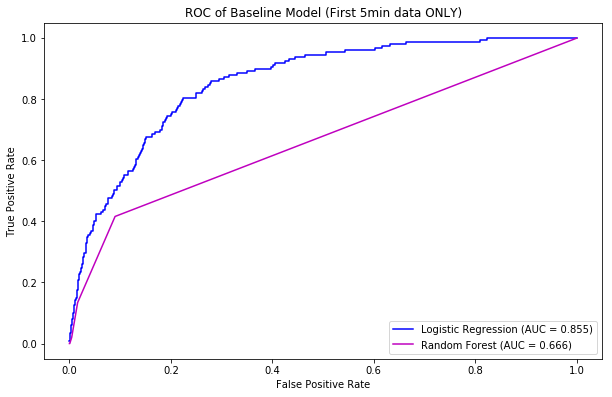

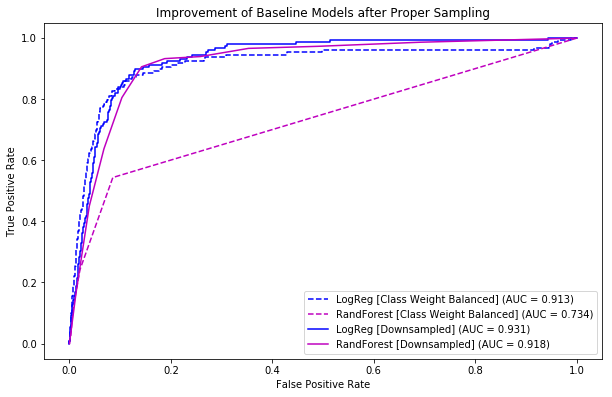

In [21]:
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt
%matplotlib inline


####The very, very, very naive baseline
# First to subsample the training set so that it has size same as downsampled set
idx_baby = np.random.randint(0, len(Y_train), len(Y_train_ds))
X_train_baby, Y_train_baby = X_train_scaled[idx_baby,:], Y_train.iloc[idx_baby]

lr_baby = LogisticRegression()
lr_baby.fit(X_train_baby, Y_train_baby)
preds_lr_baby = lr_baby.predict_proba(X_test_scaled)[:, 1]
pred_lr_baby = lr_baby.predict(X_test_scaled)
fpr_lr_baby, tpr_lr_baby, threshoulds_lr_baby = roc_curve(Y_test, preds_lr_baby)
roc_auc_lr_baby = auc(fpr_lr_baby, tpr_lr_baby)

rf_baby = RandomForestClassifier()
rf_baby.fit(X_train_baby, Y_train_baby)
preds_rf_baby = rf_baby.predict_proba(X_test_scaled)[:, 1]
pred_rf_baby = rf_baby.predict(X_test_scaled)
fpr_rf_baby, tpr_rf_baby, threshoulds_rf_baby = roc_curve(Y_test, preds_rf_baby)
roc_auc_rf_baby = auc(fpr_rf_baby, tpr_rf_baby)

plt.figure(figsize = (10, 10*0.618))
plt.title('ROC of Baseline Model (First '+str(predict_by)+'min data ONLY)')
plt.plot(fpr_lr_baby, tpr_lr_baby, 'b',label = 'Logistic Regression' + ' (AUC = %0.3f)' % roc_auc_lr_baby)
plt.plot(fpr_rf_baby, tpr_rf_baby, 'm',label = 'Random Forest' + ' (AUC = %0.3f)' % roc_auc_rf_baby)
plt.legend(loc = 'lower right')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

##############################################################################
# Logistic Regression Class Balanced
lr_baseline = LogisticRegression(class_weight='balanced')
lr_baseline.fit(X_train_scaled, Y_train)
preds_lr_baseline = lr_baseline.predict_proba(X_test_scaled)[:, 1]
pred_lr_baseline = lr_baseline.predict(X_test_scaled)
fpr_lr_baseline, tpr_lr_baseline, thresholds_lr_baseline = roc_curve(Y_test, preds_lr_baseline)
roc_auc_lr_baseline = auc(fpr_lr_baseline, tpr_lr_baseline)

# Random Forest Class Balanced
rf_baseline = RandomForestClassifier(class_weight='balanced')
rf_baseline.fit(X_train_scaled, Y_train)
preds_rf_baseline = rf_baseline.predict_proba(X_test_scaled)[:, 1]
pred_rf_baseline = rf_baseline.predict(X_test_scaled)
fpr_rf_baseline, tpr_rf_baseline, thresholds_rf_baseline = roc_curve(Y_test, preds_rf_baseline)
roc_auc_rf_baseline = auc(fpr_rf_baseline, tpr_rf_baseline)

# Logistic Regression Downsampled
lr_baseline_ds = LogisticRegression()
lr_baseline_ds.fit(X_train_ds_scaled, Y_train_ds)
preds_lr_baseline_ds = lr_baseline_ds.predict_proba(X_test_ds_scaled)[:, 1]
pred_lr_baseline_ds = lr_baseline_ds.predict(X_test_ds_scaled)
fpr_lr_baseline_ds, tpr_lr_baseline_ds, thresholds_lr_baseline_ds = roc_curve(Y_test, preds_lr_baseline_ds)
roc_auc_lr_baseline_ds = auc(fpr_lr_baseline_ds, tpr_lr_baseline_ds)

# Random Forest Downsampled
rf_baseline_ds = RandomForestClassifier()
rf_baseline_ds.fit(X_train_ds_scaled, Y_train_ds)
preds_rf_baseline_ds = rf_baseline_ds.predict_proba(X_test_ds_scaled)[:, 1]
pred_rf_baseline_ds = rf_baseline_ds.predict(X_test_ds_scaled)
fpr_rf_baseline_ds, tpr_rf_baseline_ds, thresholds_rf_baseline_ds = roc_curve(Y_test, preds_rf_baseline_ds)
roc_auc_rf_baseline_ds = auc(fpr_rf_baseline_ds, tpr_rf_baseline_ds)

# Plot the ROC curves
plt.figure(figsize = (10, 10*0.618))
plt.title('Improvement of Baseline Models after Proper Sampling')
plt.plot(fpr_lr_baseline, tpr_lr_baseline, 'b--', label = 'LogReg [Class Weight Balanced]' + ' (AUC = %0.3f)' % roc_auc_lr_baseline)
plt.plot(fpr_rf_baseline, tpr_rf_baseline, 'm--',label = 'RandForest [Class Weight Balanced]' + ' (AUC = %0.3f)' % roc_auc_rf_baseline)
plt.plot(fpr_lr_baseline_ds, tpr_lr_baseline_ds, 'b',label = 'LogReg [Downsampled]' + ' (AUC = %0.3f)' % roc_auc_lr_baseline_ds)
plt.plot(fpr_rf_baseline_ds, tpr_rf_baseline_ds, 'm',label = 'RandForest [Downsampled]' + ' (AUC = %0.3f)' % roc_auc_rf_baseline_ds)
plt.legend(loc = 'lower right')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

## Model Explanation using Lime

In [96]:
import lime
from lime import lime_tabular

def explain_model(mdl_clf, train_X, test_X, test_rec_idx=-1, ftr_num=10):
    
    predict_fn = lambda x: mdl_clf.predict_proba(encoder.transform(x)).astype(float)
    explainer = lime.lime_tabular.LimeTabularExplainer(np.asarray(train_X), feature_names = feature_names, 
                                                       class_names=['Not Viral', 'IsViral'],
                                                       categorical_features=categorical_features, 
                                                       categorical_names=categorical_names
                                                      )
    
    if test_rec_idx==-1:
        test_rec_idx = np.random.choice(test_X.index.values)
    
    exp = explainer.explain_instance(test_X.loc[test_rec_idx], predict_fn, num_features=ftr_num)
    exp.show_in_notebook(show_table=True, show_all=False)

In [30]:
Y_test[Y_test==1].head()

12386    1
37588    1
32659    1
51713    1
44944    1
Name: Y, dtype: int64

In [31]:
data.loc[12386]

comment_karma                9467
link_karma                   4650
over_18                     False
subreddit                  gaming
subreddit_subscribers    19757643
stickied                    False
gilded                          0
is_self                     False
score_5                        25
num_comments_5                  2
num_crossposts_5                0
gilded_5                        0
Y                               1
title_len                      67
day                        Friday
hour                           20
domain                     gfycat
Name: 12386, dtype: object

In [61]:
X_test_lime_scaled.loc[12386]

comment_karma             0.066575
link_karma                0.008024
over_18                   0.000000
subreddit                 1.436183
subreddit_subscribers    20.049052
stickied                  0.000000
gilded                    0.000000
is_self                   0.000000
score_5                   7.299522
num_comments_5            0.697150
num_crossposts_5          0.000000
gilded_5                  0.000000
title_len                 1.698375
day                       0.000000
hour                      3.099783
domain                    2.315558
Name: 12386, dtype: float64

In [62]:
explain_model(lr_baby, X_train_lime_scaled, X_test_lime_scaled, 12386)

In [67]:
preds_lr_baby=pd.DataFrame(preds_lr_baby, index=Y_test.index)
pred_lr_baby=pd.DataFrame(pred_lr_baby, index=Y_test.index)

In [66]:
preds_lr_baby.loc[12386]

0    0.988123
Name: 12386, dtype: float64

In [68]:
pred_lr_baby.loc[12386]

0    1
Name: 12386, dtype: int64

In [70]:
explain_model(lr_baseline, X_train_lime_scaled, X_test_lime_scaled,12386)

In [71]:
explain_model(lr_baseline_ds, X_train_ds_lime_scaled, X_test_ds_lime_scaled,12386)

# Hyperparameter Tuning for Logistic Regression

In [106]:
# Before doing anything, aggregate X_train_ds_scaled and Y_train_ds together
#X_train_ds_scaled = pd.DataFrame(X_train_ds_scaled)
train_ds_scaled = pd.concat([pd.DataFrame(X_train_ds_scaled), pd.DataFrame(Y_train_ds)], axis = 1)

ValueError: DataFrame constructor not properly called!

$\text{Define function for AUC vs hyperparameter C.}$

In [126]:
from sklearn.model_selection import KFold
from tqdm import tqdm

# Below is a function that run k-fold cross-validation of Logistic regression on an array of C's.
def HyperParamLR(dataset, cs, p, k): # 'dataset' variable here should be X_train before scaling
    # Construct a matrix that records the values of AUC
    auc_temp = np.zeros((len(cs), k))
    
    # Cross-validation is split within the original train dataset
    kf = KFold(n_splits = k, shuffle = True) # shuffle must be True
    splits = list(kf.split(dataset)) 
    
    for i in range(len(splits)):
        train_index, val_index = splits[i]
        cv_train = dataset.iloc[train_index, :]
        cv_validate = dataset.iloc[val_index, :]
        
        X_Train, X_Val = cv_train.drop(['Y'], axis = 1), cv_validate.drop(['Y'], axis = 1)
        Y_Train, Y_Val = cv_train['Y'], cv_validate['Y']
        
        # Scale the features based on the training set splitted out
        scaler = preprocessing.StandardScaler().fit(X_Train) # Scale based on training to prevent data leakage to validation set
        X_Train_scaled = pd.DataFrame(data = scaler.transform(X_Train), columns = X_Train.columns, index = X_Train.index)
        X_Val_scaled = pd.DataFrame(data = scaler.transform(X_Val), columns = X_Val.columns, index = X_Val.index) 
        
        # Training on each fold
        for c in cs:
            j = cs.index(c)
            lr = LogisticRegression(penalty = p, C = c)
            lr.fit(X_Train_scaled, Y_Train)
            preds = lr.predict_proba(X_Val_scaled)[:, 1]
            fpr, tpr, thresholds = roc_curve(Y_Val, preds)
            auc_temp[j, i] = auc(fpr, tpr)
            
    # Build the dictionary
    aucs = {}
    for l in range(len(cs)):
        aucs.update({cs[l]: auc_temp[l, :]})
    
    auc_results = [aucs.get(k) for k in cs]
    
    return auc_results

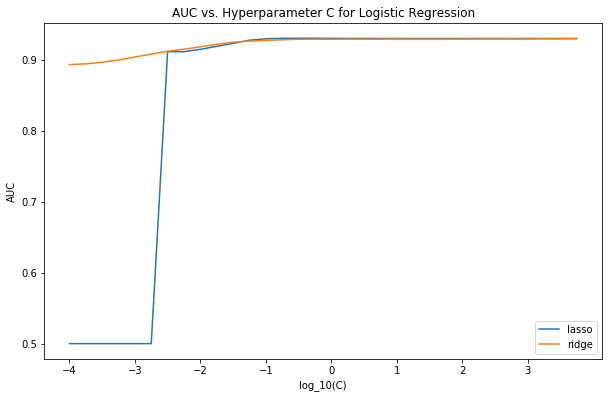

In [137]:
# Set the hyperparameter grid
cs_lr = [10**(i/4) for i in range(-16, 16)]

# 10-Fold cross-validation on downsampled set (NOTE: if we want to try class weight, then we need to revise the function)
lr_l1 = np.mean(HyperParamLR(train_ds_scaled, cs_lr, 'l1', 10), axis = 1)
lr_l2 = np.mean(HyperParamLR(train_ds_scaled, cs_lr, 'l2', 10), axis = 1)
plt.figure(figsize = (10, 10*0.618))
plt.plot(np.log10(cs_lr), lr_l1, label = 'lasso')
plt.plot(np.log10(cs_lr), lr_l2, label = 'ridge')
plt.title('AUC vs. Hyperparameter C for Logistic Regression')
plt.legend(loc = 'lower right')
plt.xlabel('log_10(C)')
plt.ylabel('AUC')
plt.xticks(np.arange(-4, 4))
plt.show()

$\text{Check for overfitting.}$

In [138]:
# Plot n randomly-chosen ROC of the k folds (Hyperparameter chosen by the best AUC)
def PlotROCs(dataset, c, p, k, n): # 'dataset' variable here should be X_train before scaling
    # Construct a figure
    plt.figure(figsize = (10, 10*0.618))
    plt.title('ROC of Random Chosen ' + str(n) + ' Folds for Logistic Regression ({} Regulation)'.format(p))

    plt.ylabel('True Positive Rate')
    plt.xlabel('False Positive Rate')
    
    # Cross-validation is split within the original train dataset
    kf = KFold(n_splits = k, shuffle = True) # shuffle must be True
    splits = list(kf.split(dataset)) 
    
    for i in np.random.choice(k, size = n, replace = False):
        train_index, val_index = splits[i]
        cv_train = dataset.iloc[train_index, :]
        cv_validate = dataset.iloc[val_index, :]
        
        X_Train, X_Val = cv_train.drop(['Y'], axis = 1), cv_validate.drop(['Y'], axis = 1)
        Y_Train, Y_Val = cv_train['Y'], cv_validate['Y']
        
        # Scale the features based on the training set splitted out
        scaler = preprocessing.StandardScaler().fit(X_Train) # Scale based on training to prevent data leakage to validation set
        X_Train_scaled = pd.DataFrame(data = scaler.transform(X_Train), columns = X_Train.columns, index = X_Train.index)
        X_Val_scaled = pd.DataFrame(data = scaler.transform(X_Val), columns = X_Val.columns, index = X_Val.index) 
        
        # Train and plot on each selected fold
        lr = LogisticRegression(penalty = p, C = c)
        lr.fit(X_Train_scaled, Y_Train)
        preds = lr.predict_proba(X_Val_scaled)[:, 1]
        fpr, tpr, thresholds = roc_curve(Y_Val, preds)
        roc_auc = auc(fpr, tpr)
        plt.plot(fpr, tpr, label = 'Fold {}'.format(i) + ' (AUC = %0.3f)' % roc_auc)
        plt.legend(loc = 'lower right')

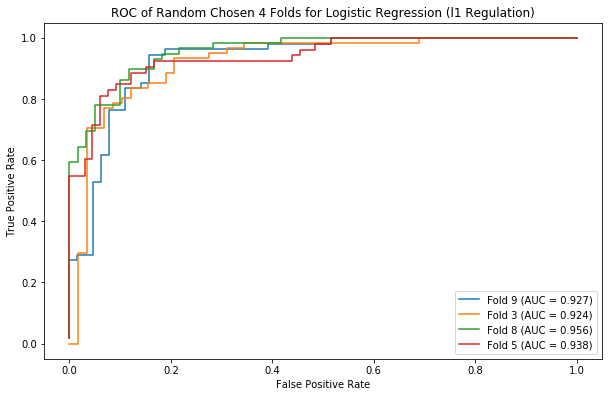

In [140]:
PlotROCs(train_data_ds, 10**(-0.5), 'l1', 10, 4)
# If the curves overlap, then overfitting does not occur within the training and validation set

$\text{Use the best hyperparameter to run LogReg and compare with baseline.}$

Text(0.5,0,'False Positive Rate')

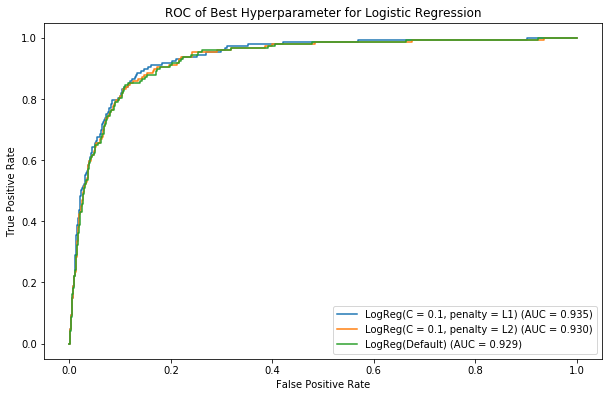

In [216]:
# Run on the best hyper-parameters
lr_best_l1 = LogisticRegression(C = 0.1, penalty = 'l1')
lr_best_l1.fit(X_train_ds_scaled, Y_train_ds)
preds_lr_best_l1 = lr_best_l1.predict_proba(X_test_scaled)[:, 1]
fpr_lr_best_l1, tpr_lr_best_l1, thresholds_lr_best_l1 = roc_curve(Y_test, preds_lr_best_l1)
roc_auc_lr_best_l1 = auc(fpr_lr_best_l1, tpr_lr_best_l1)

lr_best_l2 = LogisticRegression(C = 0.1, penalty = 'l2')
lr_best_l2.fit(X_train_ds_scaled, Y_train_ds)
preds_lr_best_l2 = lr_best_l2.predict_proba(X_test_scaled)[:, 1]
fpr_lr_best_l2, tpr_lr_best_l2, thresholds_lr_best_l2 = roc_curve(Y_test, preds_lr_best_l2)
roc_auc_lr_best_l2 = auc(fpr_lr_best_l2, tpr_lr_best_l2)


plt.figure(figsize = (10, 10*0.618))
plt.title('ROC of Best Hyperparameter for Logistic Regression')
plt.plot(fpr_lr_best_l1, tpr_lr_best_l1, label = 'LogReg(C = 0.1, penalty = L1)' + ' (AUC = %0.3f)' % roc_auc_lr_best_l1)
plt.plot(fpr_lr_best_l2, tpr_lr_best_l2, label = 'LogReg(C = 0.1, penalty = L2)' + ' (AUC = %0.3f)' % roc_auc_lr_best_l2)
plt.plot(fpr_lr_baseline_ds, tpr_lr_baseline_ds, label = 'LogReg(Default)' + ' (AUC = %0.3f)' % roc_auc_lr_baseline_ds)
plt.legend(loc = 'lower right')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

# Hyerparameter Tuning for Random Forest

$\text{Define function to find AUC given hyperparameter min_samples_split and min_samples_leaf.}$

In [170]:
# Hyperparameter tuning for Random Forest
def HyperParamRF(dataset, min_split, min_leaf, k):
    # Construct a matrix that records the values of AUC
    auc_temp = np.zeros((len(min_split), k))
    
    # Cross-validation is split within the original train dataset
    kf = KFold(n_splits = k, shuffle = True) # shuffle must be True
    splits = list(kf.split(dataset)) 
    
    for i in range(len(splits)):
        train_index, val_index = splits[i]
        cv_train = dataset.iloc[train_index, :]
        cv_validate = dataset.iloc[val_index, :]
        
        X_Train, X_Val = cv_train.drop(['Y'], axis = 1), cv_validate.drop(['Y'], axis = 1)
        Y_Train, Y_Val = cv_train['Y'], cv_validate['Y']
        
        # Scale the features based on the training set splitted out
        scaler = preprocessing.StandardScaler().fit(X_Train) # Scale based on training to prevent data leakage to validation set
        X_Train_scaled = pd.DataFrame(data = scaler.transform(X_Train), columns = X_Train.columns, index = X_Train.index)
        X_Val_scaled = pd.DataFrame(data = scaler.transform(X_Val), columns = X_Val.columns, index = X_Val.index) 
        
        for split in min_split:
            j = min_split.index(split)
            rf = RandomForestClassifier(min_samples_split = split, min_samples_leaf = min_leaf)
            rf.fit(X_Train_scaled, Y_Train)
            preds = rf.predict_proba(X_Val_scaled)[:, 1]
            fpr, tpr, thresholds = roc_curve(Y_Val, preds)
            auc_temp[j, i] = auc(fpr, tpr)
            
    # Build the dictionary
    aucs = {}
    for l in range(len(min_split)):
        aucs.update({min_split[l]: auc_temp[l, :]})
    auc_results = [aucs.get(k) for k in min_split]
    
    return auc_results

In [187]:
# Set the hyperparameter grid
min_samples_split = [2**(i/4)  for i in range(-60, -8)]
min_samples_leaf = [2**(i/1)  for i in range(-15, -2)]

# Record the mean AUC for each split and leaf
aucs = np.zeros((len(min_samples_leaf), len(min_samples_split)))
for leaf in min_samples_leaf:
    aucs[min_samples_leaf.index(leaf), :] = np.mean(HyperParamRF(train_ds_scaled, min_samples_split, leaf, 4), axis = 1)
    


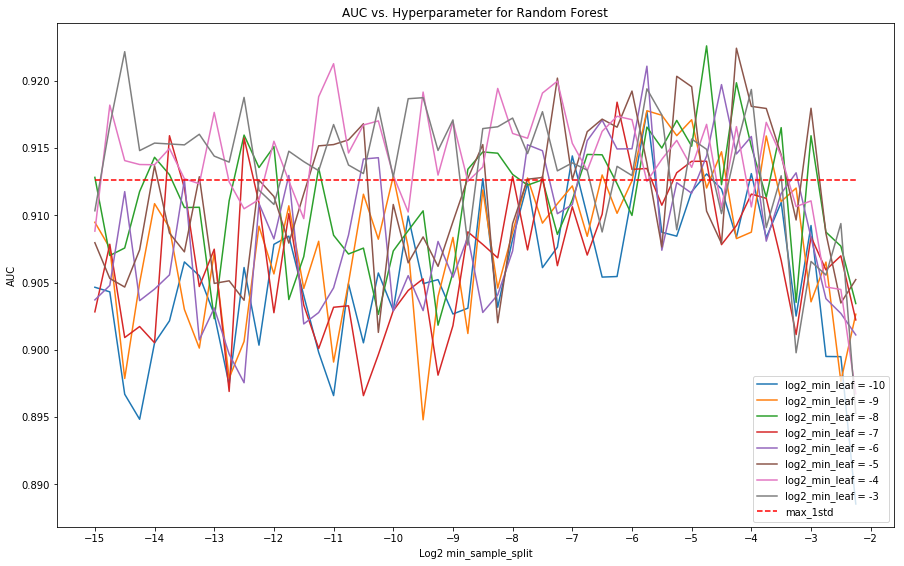

In [188]:
# max-1st-dev rule
auc_mean = np.mean(aucs, axis = 1)
auc_var = np.var(aucs, axis = 1)
auc_StdErr = np.sqrt(auc_var/10)
ii = np.where(auc_mean == np.max(auc_mean))
max_1std_val = auc_mean[ii] - auc_StdErr[ii]
max_1std = np.ones(len(min_samples_split))*max_1std_val

# Plot AUC vs hyperparameter
plt.figure(figsize = (15, 15*0.618))
for i in range(-10, -2):
    plt.plot(np.log2(min_samples_split), aucs[i+10, :], label = 'log2_min_leaf = {}'.format(i))
plt.plot(np.log2(min_samples_split), max_1std, 'r--', label = 'max_1std')
plt.title('AUC vs. Hyperparameter for Random Forest')
plt.legend(loc = 'lower right')
plt.xlabel('Log2 min_sample_split')
plt.ylabel('AUC')
plt.xticks(np.arange(-15, -1))
plt.show()

$\text{Choose the simplist model above the max-1std line: split = 10**(-13.25), leaf = 10**(-8)}$

$\text{Do feature importance on cross-validations.}$

In [154]:
import seaborn as sns
from sklearn.ensemble import RandomForestClassifier

# Apply feature importance into Random Forest(Best Hyperparameter Config)

def FeatureSelectRF(dataset, min_split, min_leaf, k, n):
    # Construct the plot
    fig, axes = plt.subplots(1, 4, figsize=(15, 15*0.5), sharey = True, sharex = True)
    plt.xticks([])
    plt.yticks([])
    
    # Randomly choose 4 folds (indexes) for plotting feature importance
    plot_true = np.random.choice(k, 4, replace = False)
    
    # Cross-validation is split within the original train dataset
    kf = KFold(n_splits = k, shuffle = True) # shuffle must be True
    splits = list(kf.split(dataset)) 
    
    for i in range(len(splits)):
        train_index, val_index = splits[i]
        cv_train = dataset.iloc[train_index, :]
        cv_validate = dataset.iloc[val_index, :]
        
        X_Train, X_Val = cv_train.drop(['Y'], axis = 1), cv_validate.drop(['Y'], axis = 1)
        Y_Train, Y_Val = cv_train['Y'], cv_validate['Y']
        
        # Scale the features based on the training set splitted out
        scaler = preprocessing.StandardScaler().fit(X_Train) # Scale based on training to prevent data leakage to validation set
        X_Train_scaled = pd.DataFrame(data = scaler.transform(X_Train), columns = X_Train.columns, index = X_Train.index)
        X_Val_scaled = pd.DataFrame(data = scaler.transform(X_Val), columns = X_Val.columns, index = X_Val.index) 
        
        # Train and plot on each selected fold (for finding 20 important features)
        rf = RandomForestClassifier(min_samples_split = min_split, min_samples_leaf = min_leaf)
        rf.fit(X_Train_scaled, Y_Train)
        
        feature_mi_rf = rf.feature_importances_
        feature_mi_rf_dict = dict(zip(X_Train.columns, feature_mi_rf))
        mi_rf = pd.DataFrame(data = list(feature_mi_rf_dict.items()), columns = ['Feature', 'Importance'])
        mi_rf_sorted = mi_rf.sort_values(by = ['Importance'], ascending = False)
        feature_selected = mi_rf_sorted['Feature'][0 : n]
        
        # Use the n important features on X_Train_scaled
        X_Train_f, X_Val_f = X_Train_scaled.filter(items = feature_selected), X_Val_scaled.filter(items = feature_selected)
        rf.fit(X_Train_f, Y_Train)
        preds = rf.predict_proba(X_Val_f)[:, 1]
        fpr, tpr, thresholds = roc_curve(Y_Val, preds)
        roc_auc = auc(fpr, tpr)
        
        #!!! Remember to build a matrix that records the ROC curve for each fold and then take average to plot generalized ROC

        if i in plot_true:
            position = plot_true.tolist().index(i) + 1
            ax = fig.add_subplot(1, 4, position)
            ax = sns.barplot(x = mi_rf_sorted['Feature'][0:10], y = mi_rf_sorted['Importance'][0:10], palette="GnBu_d")
            ax.set_title('Feature Importance of Fold {}'.format(i+1), fontsize = 10)
            ax.set_xlabel('Feature')
            ax.set_yticklabels([0.00, 0.05, 0.10, 0.15, 0.20, 0.25, 0.30, 0.35, 0.40], fontsize = 10)
            ax.set_xticklabels(ax.get_xticklabels(), fontsize = 10, rotation = 90)
            ax.tick_params(axis='x',which='both',bottom='off')

            

/Users/elle0804/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
/Users/elle0804/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
/Users/elle0804/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Passing one of 'on', 'true', 'off', 'false' as a boolean is deprecated; use an actual boolean (True/False) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)
/Users/elle0804/anaconda3/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Pas

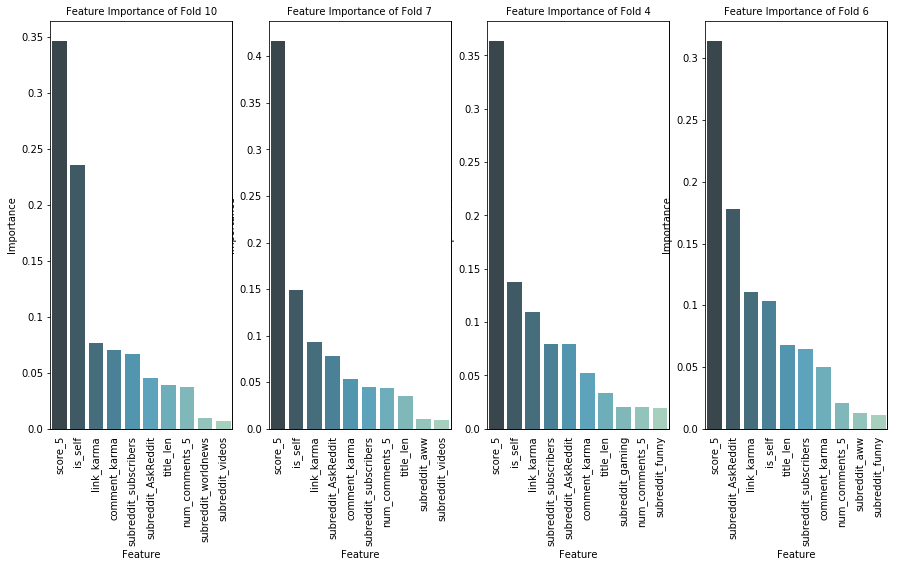

In [196]:
FeatureSelectRF(train_ds_scaled, 2**(-5), 2**(-8), 10, 10)

$\text{Question: How many features to use?}$

In [83]:
# Plot AUC vs feature number n (best hyperparam config, on k-fold validation)
def AUCvsFN (dataset, min_split, min_leaf, k, N, epoch):
    # Construct the plot
    fig, ([ax1, ax2]) = plt.subplots(1, 2, figsize=(15, 15*0.5))
    #plt.xticks([])
    #plt.yticks([])
    aucs_sum = np.zeros(len(N))
    for e in range(epoch):
        # Initialize an array recording average AUC for each n in N, the feature number array
        aucs = []
    
        # Cross-validation is split within the original train dataset
        kf = KFold(n_splits = k, shuffle = True) # shuffle must be True
        splits = list(kf.split(dataset)) 
    
        train_index, val_index = splits[0]
        cv_train = dataset.iloc[train_index, :]
        cv_validate = dataset.iloc[val_index, :]
        
        X_Train, X_Val = cv_train.drop(['Y'], axis = 1), cv_validate.drop(['Y'], axis = 1)
        Y_Train, Y_Val = cv_train['Y'], cv_validate['Y']
        
        # Scale the features based on the training set splitted out
        scaler = preprocessing.StandardScaler().fit(X_Train) # Scale based on training to prevent data leakage to validation set
        X_Train_scaled = pd.DataFrame(data = scaler.transform(X_Train), columns = X_Train.columns, index = X_Train.index)
        X_Val_scaled = pd.DataFrame(data = scaler.transform(X_Val), columns = X_Val.columns, index = X_Val.index) 
    
        # Find the feature importance
        rf = RandomForestClassifier(min_samples_split = min_split, min_samples_leaf = min_leaf)
        rf.fit(X_Train_scaled, Y_Train)
    
        feature_mi_rf = rf.feature_importances_
        feature_mi_rf_dict = dict(zip(X_Train.columns, feature_mi_rf))
        mi_rf = pd.DataFrame(data = list(feature_mi_rf_dict.items()), columns = ['Feature', 'Importance'])
        mi_rf_sorted = mi_rf.sort_values(by = ['Importance'], ascending = False)
    
        # Calculate AUC on top n features
        for n in N:
            feature_selected = mi_rf_sorted['Feature'][0 : n]
        
            # Use the n important features on X_Train_scaled
            X_Train_f, X_Val_f = X_Train_scaled.filter(items = feature_selected), X_Val_scaled.filter(items = feature_selected)
            rf.fit(X_Train_f, Y_Train)
            preds = rf.predict_proba(X_Val_f)[:, 1]
            fpr, tpr, thresholds = roc_curve(Y_Val, preds)
            roc_auc = auc(fpr, tpr)
            aucs.append(roc_auc)
            if e == 0:
                ax1.plot(fpr, tpr, label = '{} Features Selected'.format(n) + ' (AUC = %0.3f)' % roc_auc)
            
        auc_sum = aucs_sum + aucs
        
    # Visualization 
    ax1.legend(loc = 'lower right')
    ax1.set_xlabel('False Positive Rate')
    ax1.set_ylabel('Negative Positive Rate')

    ax2.plot(N, auc_sum/k)
    ax2.set_xlabel('Number of Selected Features')
    ax2.set_ylabel('AUC')
    ax2.set_xticklabels(N, fontsize = 10)
    plt.show()

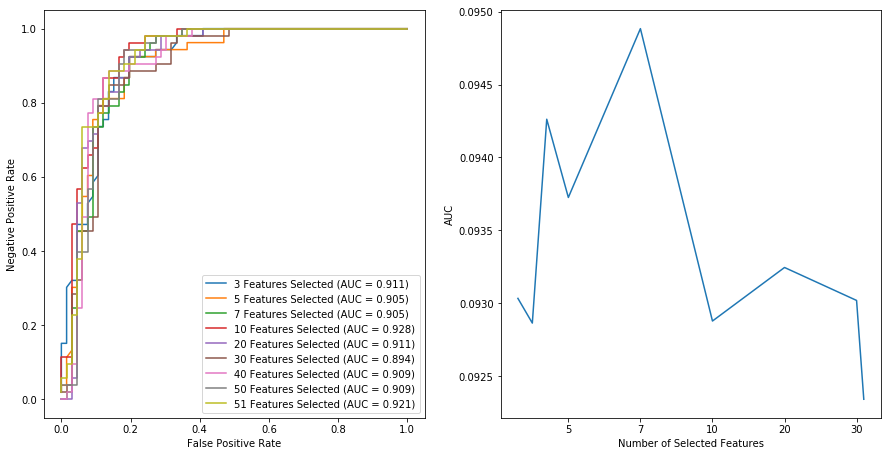

In [197]:
N = [3, 5, 7, 10, 20, 30, 40, 50, len(train_ds_scaled.columns)]
AUCvsFN (train_data_ds, 2**(-5), 2**(-8), 10, N, 100)

$\text{Check if the important features carry redundant information, i.e. highly correlated.}$

In [191]:
# Plot the covariance matrix for the n most important features.
def CovMatFea(dataset, min_split, min_leaf, n):
        
    X_Train = dataset.drop(['Y'], axis = 1)
    Y_Train = dataset['Y']
        
    # Scale the features based on the training set splitted out
    scaler = preprocessing.StandardScaler().fit(X_Train) # Scale based on training to prevent data leakage to validation set
    X_Train_scaled = pd.DataFrame(data = scaler.transform(X_Train), columns = X_Train.columns, index = X_Train.index)
    
    # Find the feature importance
    rf = RandomForestClassifier(min_samples_split = min_split, min_samples_leaf = min_leaf)
    rf.fit(X_Train_scaled, Y_Train)
    
    feature_mi_rf = rf.feature_importances_
    feature_mi_rf_dict = dict(zip(X_Train.columns, feature_mi_rf))
    mi_rf = pd.DataFrame(data = list(feature_mi_rf_dict.items()), columns = ['Feature', 'Importance'])
    mi_rf_sorted = mi_rf.sort_values(by = ['Importance'], ascending = False)
        
    # Plot the covariance matrix of top n features:
    hmap, ax = plt.subplots()
    hmap.set_size_inches(15, 15*0.618)
    hmap = sns.heatmap(X_Train_scaled.loc[:,mi_rf_sorted['Feature'][0 : n]].corr(), annot = True, ax = ax)
    plt.title('Feature Correlation Matrix')
    plt.show()


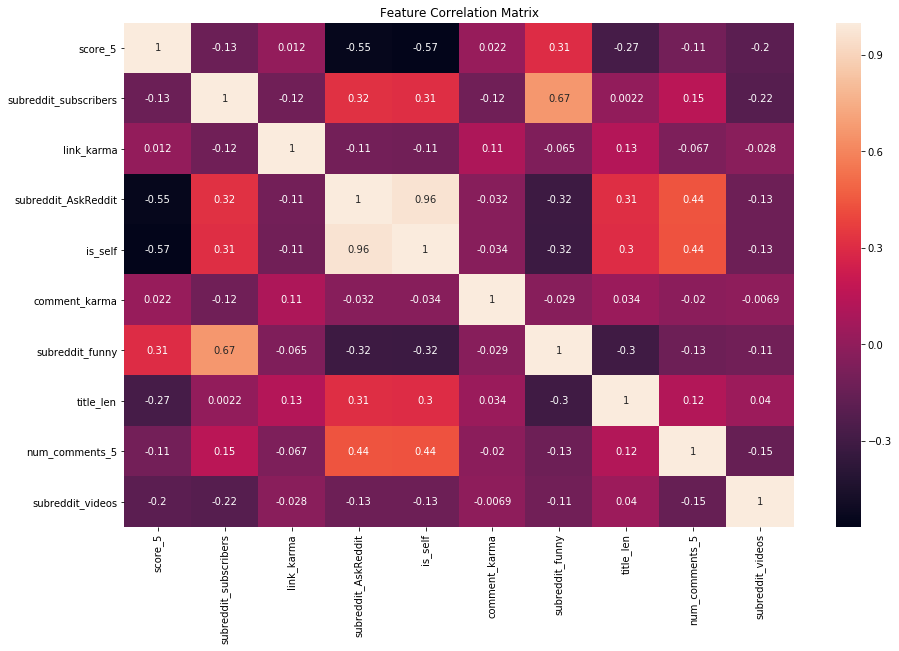

In [192]:
CovMatFea(train_ds_scaled, 2**(-5), 2**(-8), 10)

Text(0,0.5,'AUC')

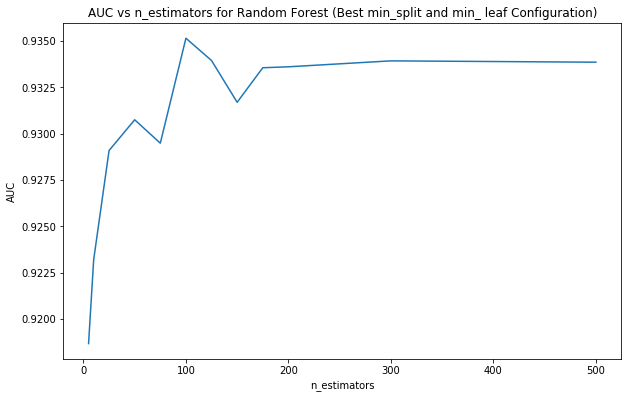

In [296]:
# Plot AUC vs n_estimators on the best split & leaf
plt.figure(figsize = (10, 10*0.618))
ne_candidate = [5, 10, 25, 50, 75, 100, 125, 150, 175, 200, 300, 500]
auc_ne = np.zeros(len(ne_candidate))
for ne in ne_candidate:
    rf_ne = RandomForestClassifier(n_estimators = ne, min_samples_split = 10**(-14), min_samples_leaf = 10**(-3))
    rf_ne.fit(X_train_ds_scaled, Y_train_ds)
    preds_rf_ne = rf_ne.predict_proba(X_test_scaled)[:, 1]
    fpr_rf_ne, tpr_rf_ne, thresholds_rf_ne = roc_curve(Y_test, preds_rf_ne)
    roc_auc_rf_ne = auc(fpr_rf_ne, tpr_rf_ne)
    auc_ne[ne_candidate.index(ne)] = roc_auc_rf_ne
    
plt.plot(ne_candidate, auc_ne)
plt.title('AUC vs n_estimators for Random Forest (Best min_split and min_ leaf Configuration)')
plt.xlabel('n_estimators')
plt.ylabel('AUC')
    

Text(0.5,0,'False Positive Rate')

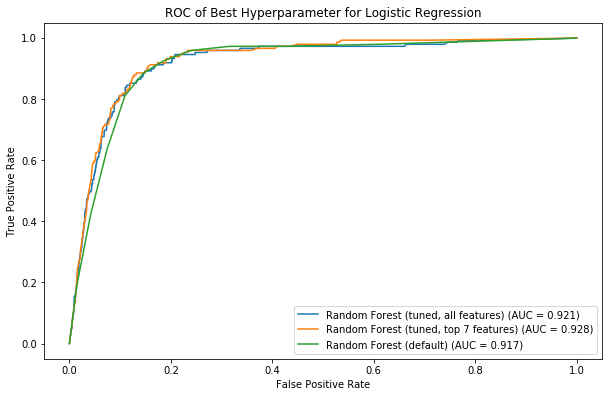

In [244]:
# Run on the best hyper-parameters
rf_best = RandomForestClassifier(min_samples_split = 10**(-14), min_samples_leaf = 10**(-3))
rf_best.fit(X_train_ds_scaled, Y_train_ds)
preds_rf_best_all = rf_best.predict_proba(X_test_scaled)[:, 1]
fpr_rf_best_all, tpr_rf_best_all, thresholds_rf_best_all = roc_curve(Y_test, preds_rf_best_all)
roc_auc_rf_best_all = auc(fpr_rf_best_all, tpr_rf_best_all)

fn = 7
feature_mi_rf = rf_best.feature_importances_
feature_mi_rf_dict = dict(zip(X_train_ds_scaled.columns, feature_mi_rf))
mi_rf = pd.DataFrame(data = list(feature_mi_rf_dict.items()), columns = ['Feature', 'Importance'])
mi_rf_sorted = mi_rf.sort_values(by = ['Importance'], ascending = False)
feature_7 = mi_rf_sorted['Feature'][0 : fn]
X_train_7, X_test_7 = X_train_ds_scaled.filter(items = feature_7), X_test_ds_scaled.filter(items = feature_7)
rf_best.fit(X_train_7, Y_train_ds)
preds_rf_best_7 = rf_best.predict_proba(X_test_7)[:, 1]
fpr_rf_best_7, tpr_rf_best_7, thresholds_rf_best_7 = roc_curve(Y_test, preds_rf_best_7)
roc_auc_rf_best_7 = auc(fpr_rf_best_7, tpr_rf_best_7)




plt.figure(figsize = (10, 10*0.618))
plt.title('ROC of Best Hyperparameter for Logistic Regression')
plt.plot(fpr_rf_best_all, tpr_rf_best_all, label = 'Random Forest (tuned, all features)' + ' (AUC = %0.3f)' % roc_auc_rf_best_all)
plt.plot(fpr_rf_best_7, tpr_rf_best_7, label = 'Random Forest (tuned, top {} features)'.format(fn) + ' (AUC = %0.3f)' % roc_auc_rf_best_7)
plt.plot(fpr_rf_baseline_ds, tpr_rf_baseline_ds, label = 'Random Forest (default)' + ' (AUC = %0.3f)' % roc_auc_rf_baseline_ds)
plt.legend(loc = 'lower right')
plt.ylabel('True Positive Rate')
plt.xlabel('False Positive Rate')

##Finally, compare all the models!
Model List: <br>
LogReg(baseline)
LogReg(downsampled baseline)<br>
LogReg(C = 0.1, downsampled & stratified, LASSO)<br>
LogReg(C = 0.1, downsampled & stratified, Ridge)<br>
<br>
RF(baseline)
RF(downsampled baseline)<br>
RF(downsampled, min_split = 10^(-13.25), min_leaf = 10^(-8), feaure number = ALL)<br>
RF(downsampled, min_split = 10^(-13.25), min_leaf = 10^(-8), feaure number = 7)<br>


In [251]:
result_table = pd.DataFrame(columns = ['AUC'], 
                           index = ['Logistic Regression (baseline)',
                                    'Logistic Regression(downsampled, default hyperparameteres)',
                                   'Logistic Regression (downsampled, C = 0.1, penalty = L1)',
                                   'Logistic Regression (downsampled, C = 0.1, penalty = L2)',
                                   'Random Forest (baseline)',
                                   'Random Forest (downsampled, default hyperparameters)',
                                   'Random Forest (downsampled, Log10(min_samples_split) = -14, Log10(min_samples_leaf) = -3, ALL features)',
                                   'Random Forest (downsampled, Log10(min_samples_split) = -14, Log10(min_samples_leaf) = -3, top 7 features)'])

result_table.loc['Logistic Regression (baseline)']  = np.round(roc_auc_lr_baby, 3)
result_table.loc['Random Forest (baseline)']  = np.round(roc_auc_rf_baby, 3)
result_table.loc['Logistic Regression(downsampled, default hyperparameteres)']  = np.around(roc_auc_lr_baseline_ds, 3)
result_table.loc['Random Forest (downsampled, default hyperparameters)']  = np.around(roc_auc_rf_baseline_ds, 3)
result_table.loc['Logistic Regression (downsampled, C = 0.1, penalty = L1)'] = np.around(roc_auc_lr_best_l1, 3)
result_table.loc['Logistic Regression (downsampled, C = 0.1, penalty = L2)'] = np.around(roc_auc_lr_best_l2, 3)
result_table.loc['Random Forest (downsampled, Log10(min_samples_split) = -14, Log10(min_samples_leaf) = -3, ALL features)'] = np.around(roc_auc_rf_best_all, 3)
result_table.loc['Random Forest (downsampled, Log10(min_samples_split) = -14, Log10(min_samples_leaf) = -3, top 7 features)'] = np.around(roc_auc_rf_best_7, 3)


result_table



,AUC
Logistic Regression (baseline),0.872
"Logistic Regression(downsampled, default hyperparameteres)",0.929
"Logistic Regression (downsampled, C = 0.1, penalty = L1)",0.935
"Logistic Regression (downsampled, C = 0.1, penalty = L2)",0.93
Random Forest (baseline),0.715
"Random Forest (downsampled, default hyperparameters)",0.917
"Random Forest (downsampled, Log10(min_samples_split) = -14, Log10(min_samples_leaf) = -3, ALL features)",0.921
"Random Forest (downsampled, Log10(min_samples_split) = -14, Log10(min_samples_leaf) = -3, top 7 features)",0.928


# NLP Stacking

In [246]:
# NLP Stacking
# Isolate the fields of the training and testing sets for NLP task
X_train_ds_nlp = pd.DataFrame(data = data_raw['title'].iloc[X_train_ds.index], columns = ['title'])

X_test_nlp = pd.DataFrame(data = data_raw['title'].iloc[X_test_ds.index], columns = ['title'])


In [279]:
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.naive_bayes import BernoulliNB
from sklearn import metrics

#instantiate TfidVectorizer
vectorizerTfidf = TfidfVectorizer(stop_words='english', binary = True, ngram_range = (1, 1), norm = 'l1', analyzer = 'char')
#fit vectorizerTfidf to and transform the training data
X_train_matrix_tfidf = vectorizerTfidf.fit_transform(X_train_ds_nlp['title'].values.astype('U'))
#transform the test and training data
X_test_matrix_tfidf = vectorizerTfidf.transform(X_test_nlp['title'].values.astype('U'))

#Bernoulli Naive Bayes model for the TfidfVectorizer
BernVectTfidf = BernoulliNB().fit(X_train_matrix_tfidf, Y_train_ds)


In [280]:
from scipy.sparse import vstack
# TODO:  Add P(Y = 1|Embedding = BernoulliVectTfidf) as a feature in the original dataset
#X_titles_ds = pd.concat([X_train_ds_nlp, X_test_nlp], axis = 0)
Y = pd.concat([Y_train_ds, Y_test], axis = 0)


#fit vectorizerTfidf to and transform the training data
matrix_tfidf = vstack([X_train_matrix_tfidf, X_test_matrix_tfidf])

#BernVectTfidf_stack = BernoulliNB().fit(matrix_tfidf, Y_titles)

BernVectTfidfPreds_stack = BernVectTfidf.predict_proba(matrix_tfidf)[:, 0]

cut_idx = len(X_train_ds.index)
X_TRAIN_stack, X_TEST_stack = X_train_ds_scaled.copy(), X_test_scaled.copy()
X_TRAIN_stack['title_proba'], X_TEST_stack['title_proba'] = BernVectTfidfPreds_stack[0 : cut_idx], BernVectTfidfPreds_stack[cut_idx : len(Y.index)]

/Users/elle0804/anaconda3/lib/python3.6/site-packages/matplotlib/figure.py:459: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


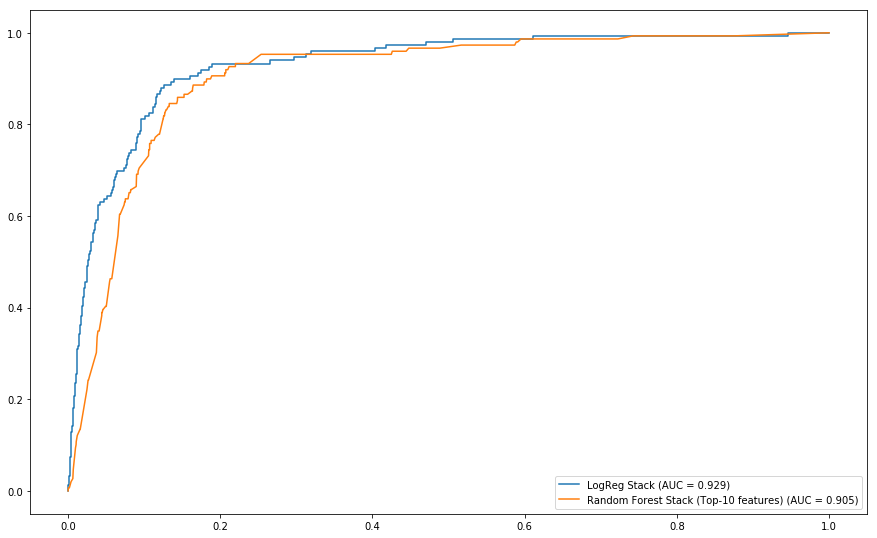

In [289]:
# TODO: stack LogReg onto the new dataset
lr_stack = LogisticRegression(C = 0.1, penalty = 'l1')
lr_stack.fit(X_TRAIN_stack, Y_train_ds)

preds_lr_stack = lr_stack.predict_proba(X_TEST_stack)[:, 1]

fpr_lr_stack, tpr_lr_stack, thresholds_lr_stack = roc_curve(Y_test, preds_lr_stack)
roc_auc_lr_stack = auc(fpr_lr_stack, tpr_lr_stack)


# TODO: stack RF onto the new dataset
rf_stack = RandomForestClassifier(min_samples_split = 2**(-14), min_samples_leaf = 2**(-3))
feature_chosen = ['score_5', 'is_self', 'subreddit_AskReddit', 'subreddit_gaming', 'subreddit_aww', 'subreddit_subscribers',
                 'link_karma', 'comment_karma', 'title_len', 'num_comments_5', 'title_proba']
#rf_stack.fit(X_TRAIN_stack.loc[:, feature_chosen], Y_train_ds)
rf_stack.fit(X_TRAIN_stack, Y_train_ds)

#preds_rf_stack = rf_stack.predict_proba(X_TEST_stack.loc[:, feature_chosen])[:, 1]
preds_rf_stack = rf_stack.predict_proba(X_TEST_stack)[:, 1]

fpr_rf_stack, tpr_rf_stack, thresholds_rf_stack = roc_curve(Y_test, preds_rf_stack)
roc_auc_rf_stack = auc(fpr_rf_stack, tpr_rf_stack)


fig = plt.figure(figsize = (15, 15*0.618))
plt.plot(fpr_lr_stack, tpr_lr_stack, label = 'LogReg Stack (AUC = %0.3f)' % roc_auc_lr_stack)
#plt.plot(fpr_lr_stack, tpr_lr_stack, label = 'LogReg Stack (AUC = %0.3f)' % roc_auc_lr_stack)
plt.plot(fpr_rf_stack, tpr_rf_stack, label = 'Random Forest Stack (Top-10 features) (AUC = %0.3f)' % roc_auc_rf_stack)
plt.legend(loc = 'lower right')
fig.show()

## Outlier detection

Automatically created module for IPython interactive environment


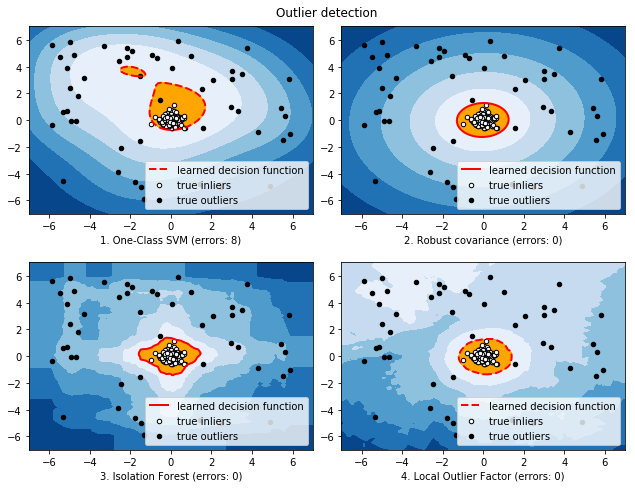

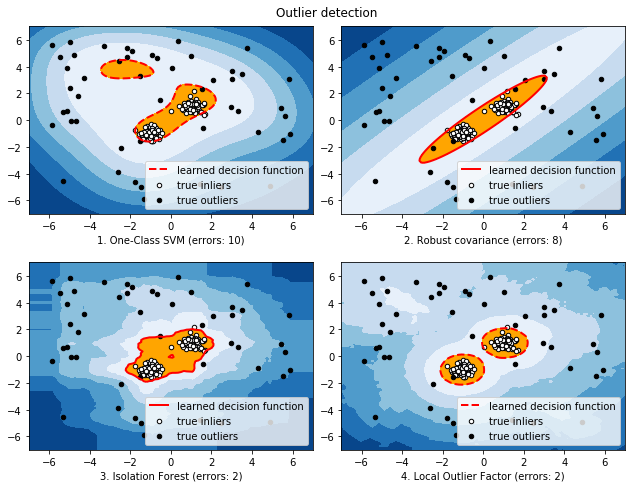

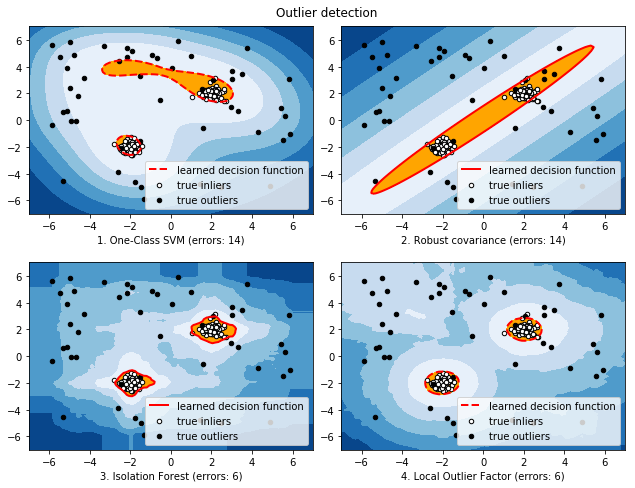

In [3]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt
import matplotlib.font_manager
%matplotlib inline

from sklearn import svm
from sklearn.covariance import EllipticEnvelope
from sklearn.ensemble import IsolationForest
from sklearn.neighbors import LocalOutlierFactor

#print(__doc__)

rng = np.random.RandomState(42)

# Example settings
n_samples = 200
outliers_fraction = 0.25
clusters_separation = [0, 1, 2]

# define two outlier detection tools to be compared
classifiers = {
    "One-Class SVM": svm.OneClassSVM(nu=0.95 * outliers_fraction + 0.05,
                                     kernel="rbf", gamma=0.1),
    "Robust covariance": EllipticEnvelope(contamination=outliers_fraction),
    "Isolation Forest": IsolationForest(max_samples=n_samples,
                                        contamination=outliers_fraction,
                                        random_state=rng),
    "Local Outlier Factor": LocalOutlierFactor(
        n_neighbors=35,
        contamination=outliers_fraction)}

# Compare given classifiers under given settings
xx, yy = np.meshgrid(np.linspace(-7, 7, 100), np.linspace(-7, 7, 100))
n_inliers = int((1. - outliers_fraction) * n_samples)
n_outliers = int(outliers_fraction * n_samples)
ground_truth = np.ones(n_samples, dtype=int)
ground_truth[-n_outliers:] = -1

# Fit the problem with varying cluster separation
for i, offset in enumerate(clusters_separation):
    np.random.seed(42)
    # Data generation
    X1 = 0.3 * np.random.randn(n_inliers // 2, 2) - offset
    X2 = 0.3 * np.random.randn(n_inliers // 2, 2) + offset
    X = np.r_[X1, X2]
    # Add outliers
    X = np.r_[X, np.random.uniform(low=-6, high=6, size=(n_outliers, 2))]

    # Fit the model
    plt.figure(figsize=(9, 7))
    for i, (clf_name, clf) in enumerate(classifiers.items()):
        # fit the data and tag outliers
        if clf_name == "Local Outlier Factor":
            y_pred = clf.fit_predict(X)
            scores_pred = clf.negative_outlier_factor_
        else:
            clf.fit(X)
            scores_pred = clf.decision_function(X)
            y_pred = clf.predict(X)
        threshold = stats.scoreatpercentile(scores_pred,
                                            100 * outliers_fraction)
        n_errors = (y_pred != ground_truth).sum()
        # plot the levels lines and the points
        if clf_name == "Local Outlier Factor":
            # decision_function is private for LOF
            Z = clf._decision_function(np.c_[xx.ravel(), yy.ravel()])
        else:
            Z = clf.decision_function(np.c_[xx.ravel(), yy.ravel()])
        Z = Z.reshape(xx.shape)
        subplot = plt.subplot(2, 2, i + 1)
        subplot.contourf(xx, yy, Z, levels=np.linspace(Z.min(), threshold, 7),
                         cmap=plt.cm.Blues_r)
        a = subplot.contour(xx, yy, Z, levels=[threshold],
                            linewidths=2, colors='red')
        subplot.contourf(xx, yy, Z, levels=[threshold, Z.max()],
                         colors='orange')
        b = subplot.scatter(X[:-n_outliers, 0], X[:-n_outliers, 1], c='white',
                            s=20, edgecolor='k')
        c = subplot.scatter(X[-n_outliers:, 0], X[-n_outliers:, 1], c='black',
                            s=20, edgecolor='k')
        subplot.axis('tight')
        subplot.legend(
            [a.collections[0], b, c],
            ['learned decision function', 'true inliers', 'true outliers'],
            prop=matplotlib.font_manager.FontProperties(size=10),
            loc='lower right')
        subplot.set_xlabel("%d. %s (errors: %d)" % (i + 1, clf_name, n_errors))
        subplot.set_xlim((-7, 7))
        subplot.set_ylim((-7, 7))
    plt.subplots_adjust(0.04, 0.1, 0.96, 0.94, 0.1, 0.26)
    plt.suptitle("Outlier detection")

plt.show()

## Time Trend detection using heatmaps

In [44]:
#Function to get Time Trends for required metric
def getTimeTrends(mtrc_col, std=False):
    #Aggregate the metric by day & hour, and drop the days with no counts at all
    datats = pd.DataFrame(data[mtrc_col].groupby([data['day'],data['hour']]).sum())
    datats = datats.pivot_table(index='day', columns='hour', values=mtrc_col, aggfunc=sum, fill_value=0)
    
    if std:
        datats = datats.apply(lambda x: (x-x.mean())/x.std())
    else:
        datats.drop(datats[datats.sum(axis=1)==0].index, axis=0, inplace=True)

    #Sort resultant pivot
    day_of_week = {'Sunday':1, 'Monday':2, 'Tuesday':3, 'Wednesday':4, 'Thursday':5, 'Friday':6, 'Saturday':7}
    datats['day_of_week'] = datats.index.map(day_of_week)
    datats.reset_index(inplace=True)
    datats.set_index(keys='day_of_week', inplace=True)
    datats.sort_values(by='day_of_week', axis=0, inplace=True)
    datats.set_index(keys='day', inplace=True)
    
    #Output
    return datats

In [53]:
import matplotlib.pyplot as plt
import seaborn as sns

#Function to plot time trends based on provided pivot table
def plotHeatMap(datadf, annt = False, sqr=False):
    hmapts, ax = plt.subplots()
    hmapts.set_size_inches(15, 15*.25)
    hmapts = sns.heatmap(datadf, ax = ax, annot = annt, square=sqr, cbar=True, xticklabels=3, yticklabels=True)
    plt.title('Time Trends')
    plt.show()

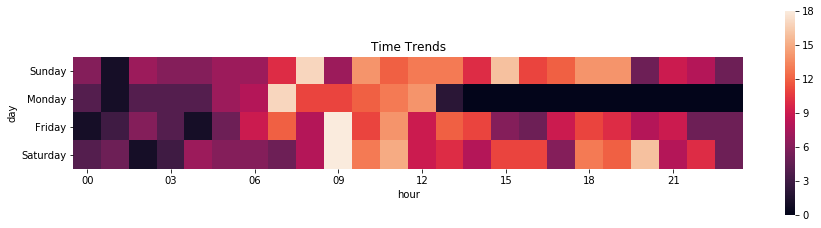

In [54]:
plotHeatMap(getTimeTrends('Y', False), False, True)

In [26]:
df = getTimeTrends('score_5')
df = df.apply(lambda x: (x-x.mean())/x.std())
df

hour,00,01,02,03,04,05,06,07,08,09,...,14,15,16,17,18,19,20,21,22,23
day,,,,,,,,,,,,,,,,,,,,,
Sunday,0.741543,0.320989,0.595565,0.588782,0.780950,0.487819,0.213137,0.301550,0.201793,0.493382,...,1.043245,0.874100,0.880945,0.849191,0.986085,1.029016,0.932118,1.179022,1.132464,0.828200
Monday,0.752276,0.960697,0.697325,0.722981,0.840910,0.725375,0.812485,0.997339,0.998427,0.894701,...,-0.902696,-0.914849,-0.917817,-0.919636,-0.907384,-0.915238,-0.920244,-0.908221,-0.906991,-0.919908
Wednesday,-1.143817,-1.267394,-1.287728,-1.288187,-1.270035,-1.286766,-1.256386,-1.262104,-1.225211,-1.279038,...,-0.902696,-0.911295,-0.908418,-0.898647,-0.901191,-0.908546,-0.912788,-0.906542,-0.906991,-0.914548
Thursday,-1.116389,-1.256506,-1.284779,-1.288187,-1.270035,-1.284993,-1.253181,-1.240906,-1.225211,-1.278145,...,-0.902696,-0.909874,-0.911310,-0.917464,-0.902740,-0.908546,-0.905333,-0.888078,-0.895944,-0.901149
Friday,-0.336487,0.714341,0.765165,0.554325,0.592252,0.734240,0.891009,0.770397,0.923965,0.623878,...,1.033927,0.991373,0.893958,0.896958,0.651670,0.820703,0.913893,0.679662,0.676136,0.941643
Saturday,1.102874,0.527873,0.514452,0.710286,0.325959,0.624325,0.592937,0.433725,0.326235,0.545223,...,0.630917,0.870546,0.962641,0.989597,1.073560,0.882611,0.892354,0.844157,0.901325,0.965761


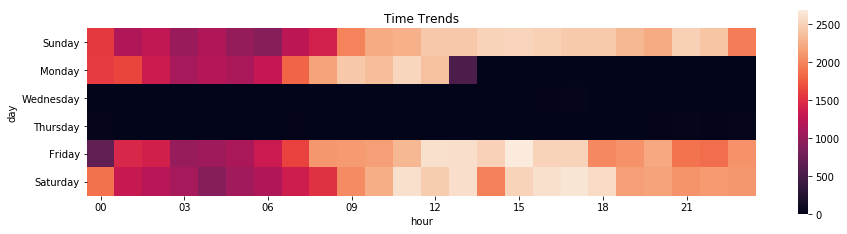

In [58]:
plotHeatMap(getTimeTrends('score_5', False), False, True)

## Final model result explanation using Lime

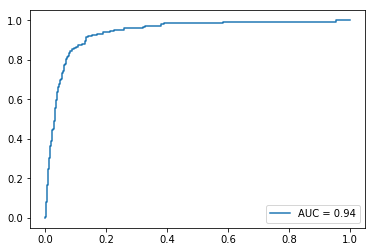

In [23]:
lr_lime = LogisticRegression(C = 0.1, penalty = 'l1')
lr_lime.fit(X_train_ds_scaled, Y_train_ds)
preds_lime = lr_lime.predict(X_test_ds_scaled)

preds_lime_proba = lr_lime.predict_proba(X_test_ds_scaled)[:, 1]

fpr_lr_lime, tpr_lr_lime, thresholds_lr_lime = roc_curve(Y_test, preds_lime_proba)
roc_auc_lr_lime = auc(fpr_lr_lime, tpr_lr_lime)

plt.plot(fpr_lr_lime, tpr_lr_lime, label = 'AUC = {}'.format(np.round(roc_auc_lr_lime, 3)))
plt.legend()

In [76]:
df_eval = pd.DataFrame(data = preds_lime - Y_test)
df_eval=df_eval.merge(pd.DataFrame(Y_test),how='outer', suffixes=('_pred', '_true'), left_index=True, right_index=True)
df_eval[df_eval['Y_true']==0].head()

,Y_pred,Y_true
6679,1,0
48296,0,0
30993,0,0
7703,1,0
13498,0,0


In [41]:
#df_eval[df_eval['Y_true']==1


10484

In [77]:
FN = df_eval[df_eval['Y_pred']==-1]
FP = df_eval[df_eval['Y_pred']==1]
AP = df_eval[df_eval['Y_pred']==0]
print(FP.shape, FN.shape, AP.shape)

(1297, 2) (18, 2) (9169, 2)


In [78]:
fn_rand = np.random.choice(FN.index)
print('The chosen false negative is {}'.format(fn_rand))
fp_rand = np.random.choice(FP.index)
print('The chosen false positive is {}'.format(fp_rand))

The chosen false negative is 30805
The chosen false positive is 3066


In [80]:
#AP: NV
data.loc[48296]

comment_karma                   92
link_karma                     120
over_18                       True
subreddit                AskReddit
subreddit_subscribers     20786772
stickied                     False
gilded                           0
is_self                       True
score_5                          1
num_comments_5                   7
num_crossposts_5                 0
gilded_5                         0
Y                                0
title_len                       62
day                         Monday
hour                            08
domain                      reddit
Name: 48296, dtype: object

In [97]:
#NV
explain_model(lr_lime, X_train_ds_lime_scaled, X_test_ds_lime_scaled,48296)

In [79]:
#FN
data.loc[30805]

comment_karma                    6
link_karma                      17
over_18                      False
subreddit                AskReddit
subreddit_subscribers     20775927
stickied                     False
gilded                           0
is_self                       True
score_5                          3
num_comments_5                   4
num_crossposts_5                 0
gilded_5                         0
Y                                1
title_len                       68
day                         Sunday
hour                            03
domain                      reddit
Name: 30805, dtype: object

In [84]:
#FN
explain_model(lr_lime, X_train_ds_lime_scaled, X_test_ds_lime_scaled,30805)

/anaconda3/lib/python3.6/site-packages/sklearn/linear_model/ridge.py:112: LinAlgWarning: scipy.linalg.solve
Ill-conditioned matrix detected. Result is not guaranteed to be accurate.
Reciprocal condition number2.332857e-43
  overwrite_a=True).T


In [85]:
#FP
data.loc[3066]

comment_karma                   8
link_karma                    464
over_18                     False
subreddit                     aww
subreddit_subscribers    18646641
stickied                    False
gilded                          0
is_self                     False
score_5                         9
num_comments_5                  0
num_crossposts_5                0
gilded_5                        0
Y                               0
title_len                      18
day                        Friday
hour                           08
domain                       redd
Name: 3066, dtype: object

In [86]:
#FP
explain_model(lr_lime, X_train_ds_lime_scaled, X_test_ds_lime_scaled,3066)

In [72]:
#AP: V
data.loc[12386]

comment_karma                9467
link_karma                   4650
over_18                     False
subreddit                  gaming
subreddit_subscribers    19757643
stickied                    False
gilded                          0
is_self                     False
score_5                        25
num_comments_5                  2
num_crossposts_5                0
gilded_5                        0
Y                               1
title_len                      67
day                        Friday
hour                           20
domain                     gfycat
Name: 12386, dtype: object

In [87]:
#V
explain_model(lr_lime, X_train_ds_lime_scaled, X_test_ds_lime_scaled,12386)

### Score Comparison report across models

In [27]:
from sklearn.metrics import classification_report
print('LR Baby: ', classification_report(Y_test, pred_lr_baby, target_names=['Not Viral', 'IsViral']))
print('RF Baby: ', classification_report(Y_test, pred_rf_baby, target_names=['Not Viral', 'IsViral']))
print('LR Baseline: ', classification_report(Y_test, pred_lr_baseline, target_names=['Not Viral', 'IsViral']))
print('RF Baseline: ', classification_report(Y_test, pred_rf_baseline, target_names=['Not Viral', 'IsViral']))
print('LR Baseline DS: ', classification_report(Y_test, pred_lr_baseline_ds, target_names=['Not Viral', 'IsViral']))
print('RF Baseline DS: ', classification_report(Y_test, pred_rf_baseline_ds, target_names=['Not Viral', 'IsViral']))
print('Final: ', classification_report(Y_test, preds_lime, target_names=['Not Viral', 'IsViral']))

LR Baby:               precision    recall  f1-score   support

  Not Viral       0.99      1.00      0.99     10335
    IsViral       0.22      0.05      0.08       149

avg / total       0.98      0.98      0.98     10484

RF Baby:               precision    recall  f1-score   support

  Not Viral       0.99      1.00      0.99     10335
    IsViral       0.00      0.00      0.00       149

avg / total       0.97      0.99      0.98     10484

LR Baseline:               precision    recall  f1-score   support

  Not Viral       1.00      0.90      0.94     10335
    IsViral       0.10      0.84      0.18       149

avg / total       0.98      0.89      0.93     10484

RF Baseline:               precision    recall  f1-score   support

  Not Viral       0.99      1.00      0.99     10335
    IsViral       0.20      0.01      0.01       149

avg / total       0.97      0.99      0.98     10484

LR Baseline DS:               precision    recall  f1-score   support

  Not Viral       1.0

/anaconda3/lib/python3.6/site-packages/sklearn/metrics/classification.py:1135: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


In [28]:
from sklearn.metrics import accuracy_score
print(accuracy_score(Y_test, pred_lr_baby))
print(accuracy_score(Y_test, pred_rf_baby))
print(accuracy_score(Y_test, pred_lr_baseline))
print(accuracy_score(Y_test, pred_rf_baseline))
print(accuracy_score(Y_test, pred_lr_baseline_ds))
print(accuracy_score(Y_test, pred_rf_baseline_ds))
print(accuracy_score(Y_test, preds_lime))

0.9840709652804274
0.9857878672262496
0.8947920640976726
0.9855017169019458
0.8738077069820679
0.8585463563525372
0.8745707745135445
